의료계에 인공지능을 도입하기 위해 점점 더 많은 투자가 이루어지고 있습니다. 특히 두드러지는 성과를 내는 분야는 역시 의료이미지 기반 진단입니다. 아직까지 인공지능이 진단, 치료행위 자체를 직접 수행하는 데에는 기술적인 이슈 이외에도 다양한 법리적, 정책적 이유로 어려움이 있습니다. 하지만 최근들어 인공지능의 의료이미지 기반 진단 정확도가 전문의의 수준에 근접하면서, 전문의들의 과중한 진단 업무를 보조하면서 때로는 전문의들도 놓칠 수 있는 의심 병변 영역을 제안하는 등의 용도로 활발히 사용되고 있습니다.

이것을 가능하게 한 데에는 Detection, Segmentation 등의 딥러닝 기술 발달이 큰 역할을 하였습니다. 그중 가장 대표적인 딥러닝 모델에는 2015년에 발표된 U-Net: Convolutional Networks for Biomedical Image Segmentation이 있습니다. U-Net은 제목에서도 알수 있듯 Biomedical Image Segmentation에 특화된 모델입니다. 비록 오래되고 단순한 모델 구조를 가지고 있지만, 현재도 여전히 U-Net 기반의 모델들이 용종검출(Polyp segmentation) 들의 챌린지에서 상위그룹의 성적을 내고 있습니다.

오늘은 실제 위내시경 이미지 데이터에서 용종부위를 검출하는 Polyp segmentation 태스크를 U-Net을 비롯한 다양한 모델을 통해 시도해 볼 것입니다. 이 과정을 통해서 의료영상을 처리할 때의 주의사항과 특이사항에 대해서도 경험하게 될 것입니다.  

**학습목표**  
- 위내시경 이미지에 용종을 표시한 데이터를 이용해 모델을 구성하고, 용종을 찾는 Segmentation 모델을 만들어 본다.
- 의료이미지 특성상 수가 적은 데이터셋을 활용하기 위한 Data augmentation을 진행해 본다.
- Encoder-Decoder Model과 U-net 모델을 구현해 보고, U-Net이 일반 Encoder-Decoder 모델 대비 어느정도 성능향상이 되는지 확인해 본다.
- U-Net에 pretrained encoder를 적용하여 성능개선을 확인해 본다.

데이터 준비 오늘의 프로젝트는 [Giana Dataset](https://giana.grand-challenge.org/Dates/)에서 제공하는 용종 내시경 데이터셋을 이용하여 진행할 것입니다.

In [1]:
# 필요 라이브러리 로딩
from __future__ import absolute_import, division
from __future__ import print_function, unicode_literals

import os
import time
import shutil
import functools

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12,12)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image
from IPython.display import clear_output

import tensorflow as tf
import tensorflow_addons as tfa
print(tf.__version__)

from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import models

2024-08-30 15:55:42.208547: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-30 15:55:42.895215: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


2.13.1


/home/yoojin/anaconda3/envs/TF_gpu/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## 데이터 수집 및 visualization

In [2]:
# !mkdir -p ~/aiffel/medical
# !ln -s ~/data/* ~/aiffel/medical

In [3]:
DATASET_PATH = '/home/yoojin/aiffel/exploration_node/8_MainQuest/data'

img_dir = os.path.join(DATASET_PATH, "train")
label_dir = os.path.join(DATASET_PATH, "train_labels")

In [4]:
x_train_filenames = [os.path.join(img_dir, filename) for filename in os.listdir(img_dir)]
x_train_filenames.sort()
y_train_filenames = [os.path.join(label_dir, filename) for filename in os.listdir(label_dir)]
y_train_filenames.sort()

In [5]:
x_train_filenames, x_test_filenames, y_train_filenames, y_test_filenames = \
                    train_test_split(x_train_filenames, y_train_filenames, test_size=0.2)

In [6]:
num_train_examples = len(x_train_filenames)
num_test_examples = len(x_test_filenames)

print("Number of training examples: {}".format(num_train_examples))
print("Number of test examples: {}".format(num_test_examples))

Number of training examples: 240
Number of test examples: 60


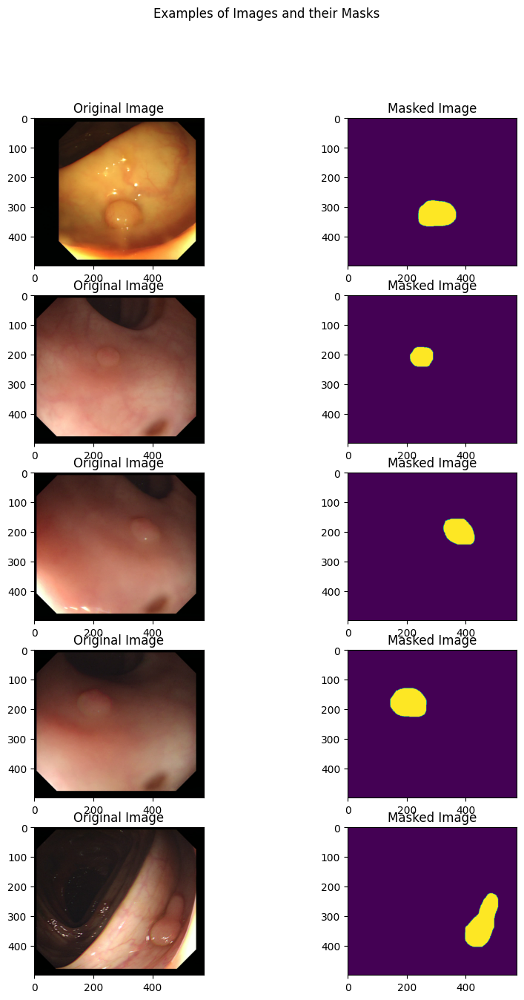

In [7]:
display_num = 5

r_choices = np.random.choice(num_train_examples, display_num)

plt.figure(figsize=(10, 15))
for i in range(0, display_num * 2, 2):
    img_num = r_choices[i // 2]
    x_pathname = x_train_filenames[img_num]
    y_pathname = y_train_filenames[img_num]

    plt.subplot(display_num, 2, i + 1)
    plt.imshow(Image.open(x_pathname))
    plt.title("Original Image")

    example_labels = Image.open(y_pathname)
    label_vals = np.unique(example_labels)

    plt.subplot(display_num, 2, i + 2)
    plt.imshow(example_labels)
    plt.title("Masked Image")
    
plt.suptitle("Examples of Images and their Masks")
plt.show()

## Data pipeline and Preprocessing

tf.data를 활용한 입력 파이프라인 설계
오늘 우리는 tf.data.Dataset을 이용해 데이터셋 구축, 배치처리 등을 진행할 것입니다. 이 과정에서 다양한 함수를 map에 적용하여 Data Augmentation을 함께 구현할 것입니다.

다음과 같은 과정으로 진행하겠습니다. 이 과정은 tf.data에 대한 텐서플로우 튜토리얼에 소개된 내용을 정리한 것입니다.

1. 이미지와 레이블 모두 파일 이름에서 파일의 바이트를 읽습니다. 라벨은 실제로 각 픽셀이 용종데이터로 (1, 0)으로 주석이 달린 이미지입니다.
2. 바이트를 이미지 형식으로 디코딩합니다.
3. _augment 함수를 통한 이미지 변환 적용 : (optional, input parameters에 따라서)
- resize-이미지를 표준 크기로 조정합니다 (eda 또는 계산 / 메모리 제한에 의해 결정됨)
- resize의 이유는 U-Net이 fully convolution networks 이므로 입력 크기에 의존하지 않기 때문입니다. 그러나 이미지 크기를 조정하지 않으면 가변 이미지 크기를 함께 배치 할 수 없으므로 배치 크기 1을 사용해야합니다.
- 성능에 영향을 줄 수 있으므로 이미지 크기를 조정하여 미니 배치별로 이미지 크기를 조정하여 미니 배치별로 이미지 크기를 조정할 수도 있습니다.
    * hue_delta-RGB 이미지의 색조를 랜덤 팩터로 조정합니다. 이것은 실제 이미지에만 적용됩니다 (라벨 이미지가 아님). hue_delta는[0, 0.5]간격에 있어야합니다.
    * horizontal_flip-0.5 확률로 중심 축을 따라 이미지를 수평으로 뒤집습니다. 이 변환은 레이블과 실제 이미지 모두에 적용해야합니다.
    * width_shift_range 및height_shift_range는 이미지를 가로 또는 세로로 임의로 변환하는 범위 (전체 너비 또는 높이의 일부)입니다. 이 변환은 레이블과 실제 이미지 모두에 적용해야 합니다.
    * rescale-이미지를 일정한 비율로 다시 조정합니다 (예 : 1/255.)
4. 데이터를 섞고, 데이터를 반복하여 학습합니다.

**Data augmentation의 필요성**  
Data augmentation은 딥러닝을 이용한 이미지 처리분야 (classification, detection, segmentation 등) 에서 널리 쓰이는 테크닉입니다. 의료영상 처리와 같이 데이터 갯수가 부족한 경우 이런 기법이 큰 힘을 발휘하게 됩니다.

데이터 증가는 여러 무작위 변환을 통해 데이터를 증가시켜 훈련 데이터의 양을 "증가"시킵니다.
훈련 시간 동안 우리 모델은 똑같은 그림을 두 번 볼 수 없습니다. 따라서 Overfitting을 방지하고, 모델이 처음보는 데이터에 대해 더 잘 일반화되도록 도와줍니다.

In [29]:
# 실제 이미지 데이터를 byte형태로 로드하고, bmp로 디코딩
# 디코딩이 완료된 image를 scale과 size를 조절
def _process_pathnames(fname, label_path):
    # We map this function onto each pathname pair
    img_str = tf.io.read_file(fname)
    img = tf.image.decode_bmp(img_str, channels=3)

    label_img_str = tf.io.read_file(label_path)
    label_img = tf.image.decode_bmp(label_img_str, channels=3)
    label_img = tf.image.rgb_to_grayscale(label_img)

    resize = [image_size, image_size]
    img = tf.image.resize(img, resize)
    label_img = tf.image.resize(label_img, resize)

    scale = 1 / 255.
    img = tf.cast(img, dtype=tf.float32) * scale
    label_img = tf.cast(label_img, dtype=tf.float32) * scale

    return img, label_img

In [30]:
# 로드한 이미지를 기반으로 이미지의 위치를 적절히 이동(shift)시키는 함수
# 입력이미지와 라벨의 쌍을 동일하게 shift
def shift_img(output_img, label_img, width_shift_range, height_shift_range):
    """This fn will perform the horizontal or vertical shift"""
    if width_shift_range or height_shift_range:
        if width_shift_range:
                width_shift_range = tf.random.uniform([],
                                                  -width_shift_range * img_shape[1],
                                                  width_shift_range * img_shape[1])
        if height_shift_range:
                height_shift_range = tf.random.uniform([],
                                                   -height_shift_range * img_shape[0],
                                                   height_shift_range * img_shape[0])
        output_img = tfa.image.translate(output_img,
                                         [width_shift_range, height_shift_range])
        label_img = tfa.image.translate(label_img,
                                        [width_shift_range, height_shift_range])
    return output_img, label_img

In [31]:
# 로드한 이미지를 기반으로 이미지를 flip
# 50%의 확률로 좌우반전만 구현하였고, 상하반전은 적용하지 않았습니다
def flip_img(horizontal_flip, tr_img, label_img):
    if horizontal_flip:
        flip_prob = tf.random.uniform([], 0.0, 1.0)
        tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                lambda: (tr_img, label_img))
    return tr_img, label_img

In [32]:
# 위에서 구현한 Augmentation용 함수를 이용해 Data augmentation에 사용하는 _augment() 함수를 구성합니다. 
# 위에서 적용한 것들 이외에도 resize, hue_delta가 적용됨
def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             scale=1,  # Scale image e.g. 1 / 255.
             hue_delta=0.,  # Adjust the hue of an RGB image by random factor
             horizontal_flip=True,  # Random left right flip,
             width_shift_range=0.05,  # Randomly translate the image horizontally
             height_shift_range=0.05):  # Randomly translate the image vertically 
    if resize is not None:
        # Resize both images
        label_img = tf.image.resize(label_img, resize)
        img = tf.image.resize(img, resize)
  
    if hue_delta:
        img = tf.image.random_hue(img, hue_delta)
  
    img, label_img = flip_img(horizontal_flip, img, label_img)
    img, label_img = shift_img(img, label_img, width_shift_range, height_shift_range)
    label_img = tf.cast(label_img, dtype=tf.float32) * scale
    img = tf.cast(img, dtype=tf.float32) * scale
    return img, label_img

In [33]:
#  tf.data.Dataset을 이용하여 데이터셋 배치구성, 셔플링 등을 구현
def get_baseline_dataset(filenames,
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=4,
                         batch_size=batch_size,
                         is_train=True):
    num_x = len(filenames)
    # Create a dataset from the filenames and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    # Map our preprocessing function to every element in our dataset, taking
    # advantage of multithreading
    dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)

    if is_train:# 학습을 진행할시에만 위에 augment를 진행합니다.
        #if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
        #  assert batch_size == 1, "Batching images must be of the same size"
        dataset = dataset.map(preproc_fn, num_parallel_calls=threads)
        dataset = dataset.shuffle(num_x * 10)

    dataset = dataset.batch(batch_size)
    return dataset

## 모델 build

두개의 모델을 만들어보고 성능을 비교할 예정임    

## 모델 선택하기 1 : encoder-decoder

**Encoder-Decoder architecture**
Encoder를 이용해 우리가 가진 Train data를 작은 차원의 공간에 압축하는 방식으로 동작합니다.  
Decoder는 Encoder가 압축한 데이터들을 우리가 원하는 label 데이터와 같도록 재생성합니다.  
이렇게 생성된 데이터와 label 간의 차이가 작아지도록 Encoder와 Decoder의 파라미터들이 End-to-End로 학습됩니다.  

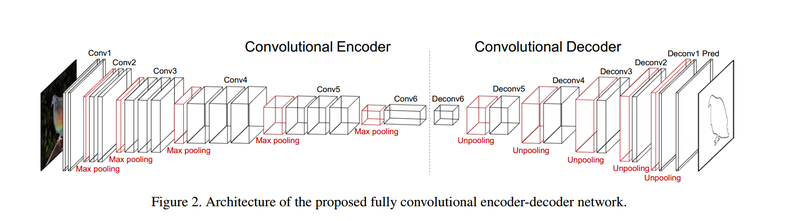

**Encoder**  
input data의 shape가 다음과 같이 되도록 네트워크를 구성합니다.  
inputs = [batch_size, 256, 256, 3]  
conv1 = [batch_size, 128, 128, 64]  
conv2 = [batch_size, 64, 64, 128]  
conv3 = [batch_size, 32, 32, 256]  
outputs = [batch_size, 16, 16, 512]  
Convolution - Normalization - Activation 등의 조합을 다양하게 생각해 봅시다.  
Encoder의 차원을 줄여가는 방법으로 Pooling을 쓸지 Convolution with stride=2 로 할지 선택해 볼 수 있습니다.  

**Decoder**  
Encoder의 mirror 형태로 만들어 봅시다.  
input data의 shape이 다음과 같이 되도록 네트워크를 구성합니다.  
inputs = encoder의 outputs = [batch_size, 16, 16, 512]  
conv_transpose1 = [batch_size, 32, 32, 256]  
conv_transpose2 = [batch_size, 64, 64, 128]  
conv_transpose3 = [batch_size, 128, 128, 64]  
outputs = [batch_size, 256, 256, 1]  

In [34]:
# Set hyperparameters

image_size = 256
img_shape = (image_size, image_size, 3)
batch_size = 8
max_epochs = 50

In [35]:
train_dataset = get_baseline_dataset(x_train_filenames, # 학습 데이터
                                     y_train_filenames) # 정답 데이터
train_dataset = train_dataset.repeat()
test_dataset = get_baseline_dataset(x_test_filenames,
                                    y_test_filenames,
                                    is_train=False)
train_dataset

<_RepeatDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None))>

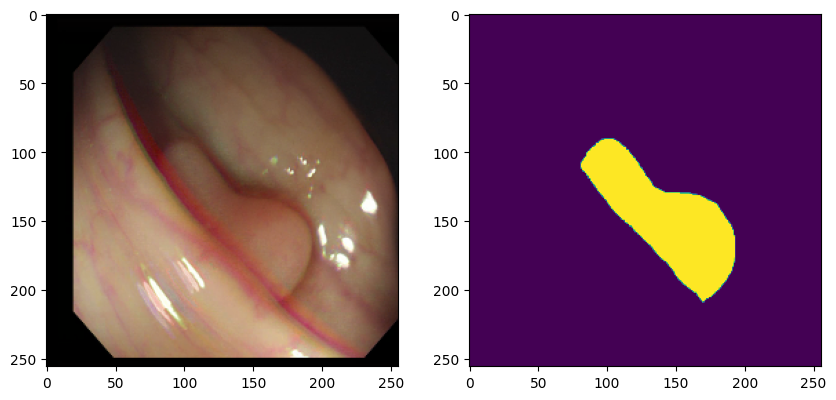

In [36]:
# data augmentation 효과가 잘 적용되었을지 학습 데이터 확인
for images, labels in train_dataset.take(1):
    # Running next element in our graph will produce a batch of images
    plt.figure(figsize=(10, 10))
    img = images[0]

    plt.subplot(1, 2, 1)
    plt.imshow(img)

    plt.subplot(1, 2, 2)
    plt.imshow(labels[0, :, :, 0])
    plt.show()

In [37]:
# inputs: [batch_size, 256, 256, 3]
encoder = tf.keras.Sequential(name='encoder')

# conv-batchnorm-activation-maxpool
encoder.add(layers.Conv2D(64, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(64, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv1: [batch_size, 128, 128, 64]

encoder.add(layers.Conv2D(128, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(128, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv2: [batch_size, 64, 64, 128]

encoder.add(layers.Conv2D(256, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(256, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv3: [batch_size, 32, 32, 256]

encoder.add(layers.Conv2D(512, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(512, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv4-outputs: [batch_size, 16, 16, 512]

In [38]:
# Encoder 제대로 만들어졌는지 확인

bottleneck = encoder(tf.random.normal([batch_size, 256, 256, 3]))
print(bottleneck.shape)   # (batch_size, 16, 16, 512) 이 나오는지 확인

(8, 16, 16, 512)


In [39]:
# inputs: [batch_size, 16, 16, 512]
decoder = tf.keras.Sequential(name='decoder')

# conv_transpose-batchnorm-activation
decoder.add(layers.Conv2DTranspose(256, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose1: [batch_size, 32, 32, 256]
decoder.add(layers.Conv2D(256, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(128, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose2: [batch_size, 64, 64, 128]
decoder.add(layers.Conv2D(128, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(64, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose3: [batch_size, 128, 128, 64]
decoder.add(layers.Conv2D(64, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(32, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv transpose4-outputs: [batch_size, 256, 256, 32]
decoder.add(layers.Conv2D(32, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(1, 1, strides=1, padding='same', activation='sigmoid'))

In [40]:
# decoder 제대로 만들어졌는지 확인

predictions = decoder(bottleneck)
print(predictions.shape)    # (batch_size, 256, 256, 1) 이 나오는지 확인

(8, 256, 256, 1)


In [41]:
# 인코더와 디코더 모델 합치기
ed_model = tf.keras.Sequential()

ed_model.add(encoder)
ed_model.add(decoder)

In [42]:
print('select the Encoder-Decoder model')
model = ed_model
checkpoint_dir =os.path.join(DATASET_PATH,'train_ckpt/ed_model')

select the Encoder-Decoder model


### Metric, loss function 정의하기

우리가 사용할 loss function은 다음과 같습니다.

- binary cross entropy

- dice_loss

    - Image Segmentation Task에서 정답을 더 잘 찾아내기위해 논문에 나온 Dice coefficient 수식을 추가

 
- Cross-entropy loss와 Dice loss를 같이 사용해 meanIoU를 더 올리도록 학습할 수 있다.





In [46]:
def dice_coeff(y_true, y_pred):
    smooth = 1e-10
    # Flatten the tensors
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    # Compute intersection and dice coefficient
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true_f)) + \
                                            tf.reduce_sum(tf.square(y_pred_f)) + smooth)
    return score

In [47]:
# dice loss가 최대화 되는 방향으로 구해지도록 설정
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [48]:
# binary crossentropy loss와 dice loss를 더하기
def bce_dice_loss(y_true, y_pred):
    loss = tf.reduce_mean(losses.binary_crossentropy(y_true, y_pred)) + dice_loss(y_true, y_pred)
    return loss

In [49]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [50]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

(8, 256, 256, 1)


In [51]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Sequential)        (8, 16, 16, 512)          4693056   
                                                                 
 decoder (Sequential)        (8, 256, 256, 1)          2354913   
                                                                 
Total params: 7047969 (26.89 MB)
Trainable params: 7042209 (26.86 MB)
Non-trainable params: 5760 (22.50 KB)
_________________________________________________________________


### callback 설정

- ModelCheckpoint callback 함수는 모델 학습간 특정 feature를 모니터링하다 기준점을 넘으면 모델 파라미터를 저장하는 역할을 합니다.
- LearningRateScheduler callback 함수는 학습을 진행하며, 주어진 인자의 값을 이용해 Learning rate를 조절해주는 함수입니다.
- cos_decay는 cos 함수의 모양으로 Learning rate를 조절해 주는 learning rate decay 구현입니다.

In [52]:
if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [53]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [54]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50


2024-08-30 16:01:32.319816: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x79165c2ca830 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-08-30 16:01:32.319848: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 2080, Compute Capability 7.5
2024-08-30 16:01:32.323865: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-08-30 16:01:32.422585: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


30/30 [==============================] - 15s 172ms/step - loss: 1.1217 - dice_loss: 0.7436 - val_loss: 7.8160 - val_dice_loss: 0.9045 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
30/30 [==============================] - 5s 154ms/step - loss: 0.9786 - dice_loss: 0.7152 - val_loss: 1.3357 - val_dice_loss: 0.8250 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
30/30 [==============================] - 5s 157ms/step - loss: 0.9295 - dice_loss: 0.6932 - val_loss: 1.1673 - val_dice_loss: 0.8014 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
30/30 [==============================] - 5s 161ms/step - loss: 0.9396 - dice_loss: 0.7093 - val_loss: 1.0383 - val_dice_loss: 0.7739 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0009842915460467339.
Epoch 5/50
30/30 [==============================] -

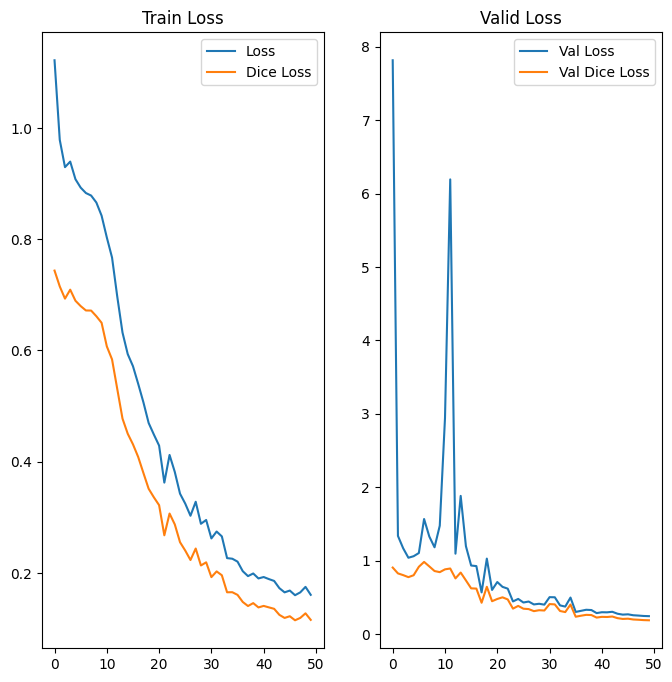

In [55]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

In [56]:
# 저장된 모델의 가중치 불러오기
# 원하는 모델을 불러올 수 있도록 적절히 주석을 처리하세요
import tensorflow as tf
from tensorflow.keras.optimizers import legacy

# 레거시 Adam 옵티마이저 사용
optimizer = legacy.Adam()

# 모델 컴파일
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=['dice_loss', 'accuracy'])

# 체크포인트 파일 경로
checkpoint_dir = os.path.join(DATASET_PATH, 'ed_ckpt/ed_model')

# 체크포인트에서 가중치 로드
model.load_weights(checkpoint_dir)

### 모델 평가

불러온 가중치를 이용해서 모델을 평가해 봅시다.  
meanIoU를 metric으로 하여 정량적으로 평가해 볼 수 있고, 실제 생성된 segmentation 이미지를 분석해서 정성적으로 평가해 볼 수 있습니다.

meanIoU란 각 이미지의 IoU 값을 평균 낸 값입니다. IoU는 segmentation 모델을 정량적으로 평가하는데 좋은 metric임
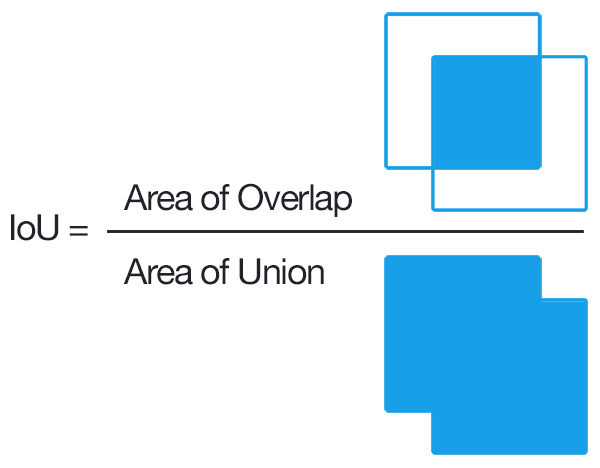

In [57]:
def mean_iou(y_true, y_pred, num_classes=2):
    # Flatten  
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])

    y_true_f = tf.cast(tf.round(y_true_f), dtype=tf.int32).numpy()
    y_pred_f = tf.cast(tf.round(y_pred_f), dtype=tf.int32).numpy()

    # calculate confusion matrix
    labels = list(range(num_classes))
    current = confusion_matrix(y_true_f, y_pred_f, labels=labels)

    # compute mean iou
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection

    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

In [58]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.6650821296569355


In [59]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

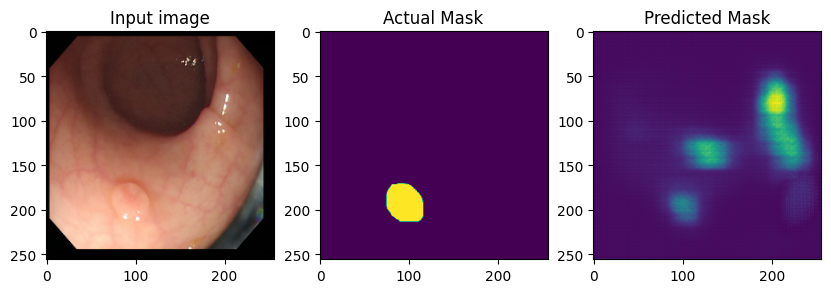

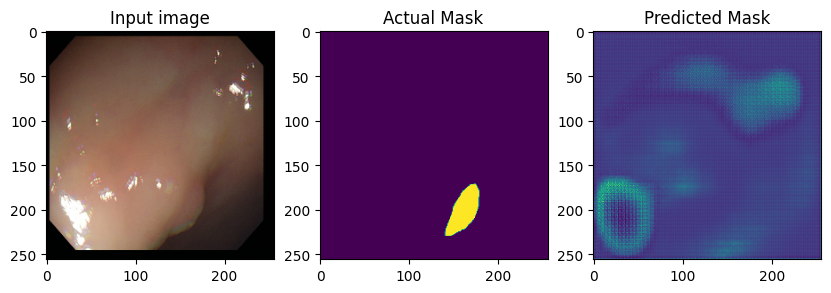

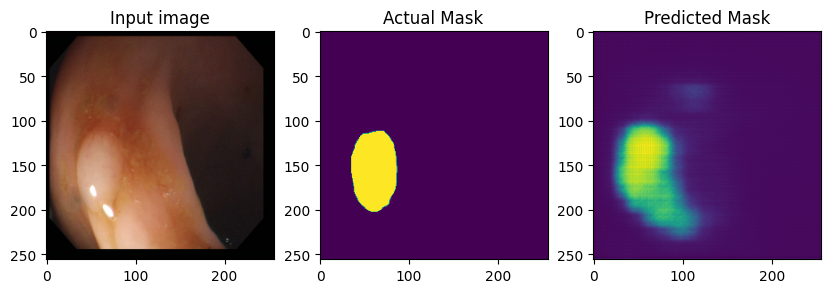

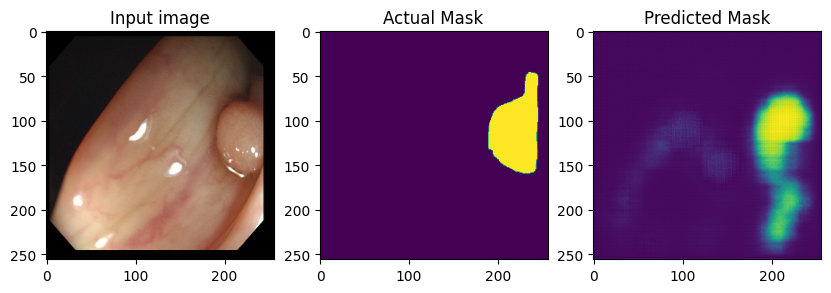

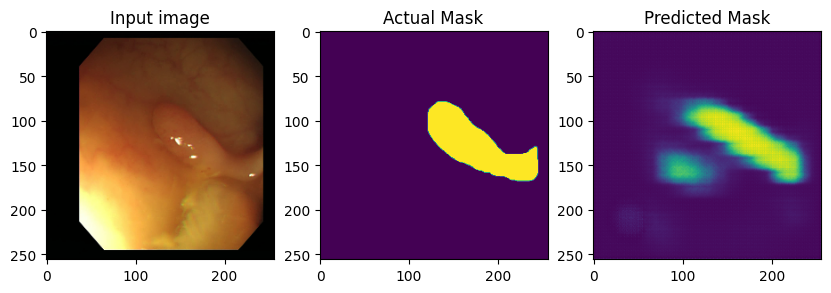

...

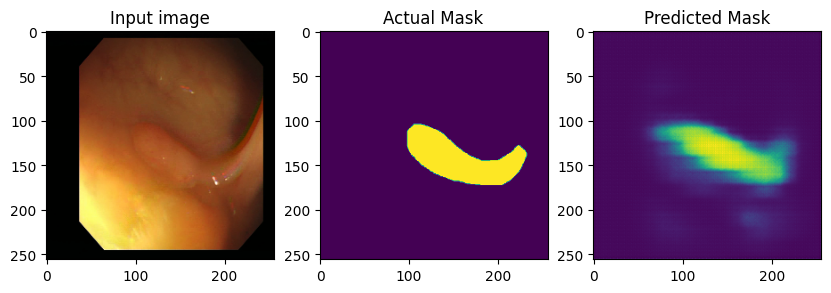

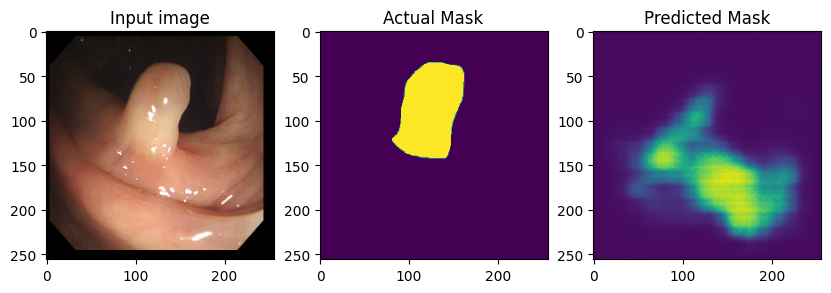

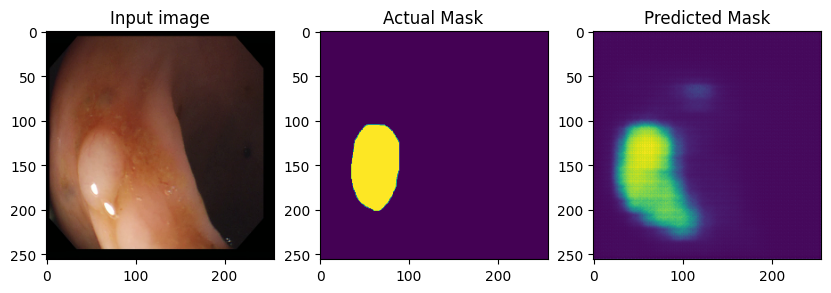

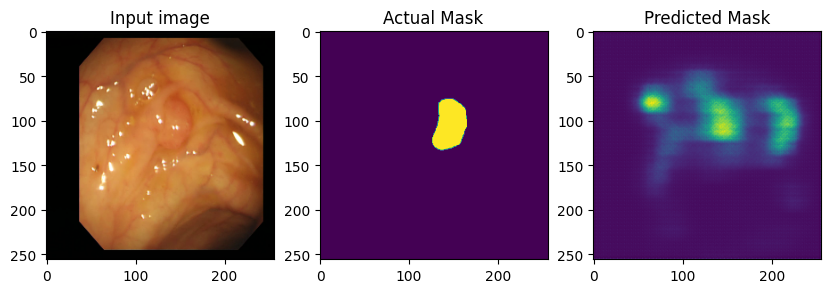

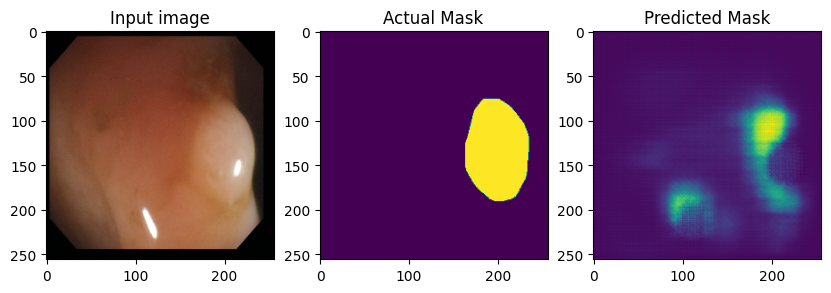

In [60]:
print_images()

## 모델 선택하기 2 : U-net

### U-Net architecture  

오늘 우리가 만들어볼 U-Net 모델구조는 아래 그림과 같습니다. 잘 보면 U-Net 원본과는 약간 차이가 있습니다. 논문 원본의 구현에서는 padding을 zero로 하기 때문에 Encoder 레이어 대비 Decoder 레이어에 약간의 사이즈 축소가 발생합니다. 그러나 우리는 padding을 same으로 두고 Encoder, Decoder간 대응하는 레이어의 사이즈를 동일하게 가져갈 것입니다. 이것은 크게 성능에 영향을 주지 않으면서도 구현이 용이할 뿐더러 이후 모델의 추가개선을 더욱 쉽게 만들어 주는 장점이 있습니다.   
  
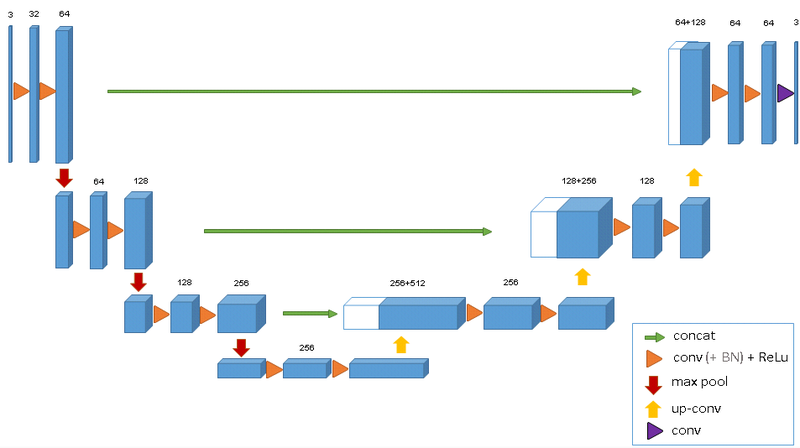

**Model subclassing을 활용한 구현**  
U-Net은 Encoder-Decoder 구조와는 달리 해당 레이어의 outputs이 바로 다음 레이어의 inputs이 되지 않습니다. 이럴때는 위에 Encoder-Decoder 모델처럼 tf.keras.Sequential()을 쓸 수가 없게 됩니다.

Sequential 구조가 아닌 네트워크를 만들 때 쓸 수 있는 API 가 바로 tf.keras functional API 입니다. 오늘 우리는 U-Net 구현을 위해 Model subclassing 방식을 사용하여, tf.keras.Model 클래스를 상속하여 구현할 것입니다.

In [64]:
class Conv(tf.keras.Model):
    def __init__(self, num_filters, kernel_size):
        super(Conv, self).__init__()
        self.conv = layers.Conv2D(num_filters, kernel_size, padding='same')
        self.bn = layers.BatchNormalization()

    def call(self, inputs, training=True):
        x = self.conv(inputs)
        x = self.bn(x, training=training)
        x = layers.ReLU()(x)

        return x

In [65]:
class ConvBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters * 2, 3)

    def call(self, inputs, training=True):
        encoder = self.conv1(inputs, training=training)
        encoder = self.conv2(encoder, training=training)

        return encoder

class ConvBlock_R(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock_R, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters, 3)

    def call(self, inputs, training=True):
        decoder = self.conv1(inputs, training=training)
        decoder = self.conv2(decoder, training=training)

        return decoder


class EncoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(EncoderBlock, self).__init__()
        self.conv_block = ConvBlock(num_filters)
        self.encoder_pool = layers.MaxPool2D()

    def call(self, inputs, training=True):
        encoder = self.conv_block(inputs, training=training)
        encoder_pool = self.encoder_pool(encoder)

        return encoder_pool, encoder


class DecoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(DecoderBlock, self).__init__()
        self.convT = layers.Conv2DTranspose(num_filters, 3, strides=2, padding='same')
        self.bn = layers.BatchNormalization()
        self.conv_block_r = ConvBlock_R(num_filters)

    def call(self, input_tensor, concat_tensor, training=True):
        decoder = self.convT(input_tensor)            
        decoder = self.bn(decoder, training=training)
        decoder = layers.ReLU()(decoder)
        decoder = tf.concat([decoder, concat_tensor], axis=-1)
        decoder = self.conv_block_r(decoder, training=training)

        return decoder

In [66]:
class UNet(tf.keras.Model):
    def __init__(self):
        super(UNet, self).__init__()
        self.encoder_block1 = EncoderBlock(64)
        self.encoder_block2 = EncoderBlock(128)
        self.encoder_block3 = EncoderBlock(256)
        self.encoder_block4 = EncoderBlock(512)

        self.center = ConvBlock(1024)

        self.decoder_block4 = DecoderBlock(512)
        self.decoder_block3 = DecoderBlock(256)
        self.decoder_block2 = DecoderBlock(128)
        self.decoder_block1 = DecoderBlock(64)

        self.output_conv = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, inputs, training=True):
        encoder1_pool, encoder1 = self.encoder_block1(inputs)
        encoder2_pool, encoder2 = self.encoder_block2(encoder1_pool)
        encoder3_pool, encoder3 = self.encoder_block3(encoder2_pool)
        encoder4_pool, encoder4 = self.encoder_block4(encoder3_pool)

        center = self.center(encoder4_pool)

        decoder4 = self.decoder_block4(center, encoder4)
        decoder3 = self.decoder_block3(decoder4, encoder3)
        decoder2 = self.decoder_block2(decoder3, encoder2)
        decoder1 = self.decoder_block1(decoder2, encoder1)

        outputs = self.output_conv(decoder1)

        return outputs

In [67]:
# UNet 모델 구현
unet_model = UNet()

리소스 부족 에러나면 batch 4로 수정해서 dataset 재구성하기

In [68]:
# # Set hyperparameters

# image_size = 256
# img_shape = (image_size, image_size, 3)
# batch_size = 4
# max_epochs = 50

In [69]:
# train_dataset = get_baseline_dataset(x_train_filenames, # 학습 데이터
#                                      y_train_filenames) # 정답 데이터
# train_dataset = train_dataset.repeat()
# test_dataset = get_baseline_dataset(x_test_filenames,
#                                     y_test_filenames,
#                                     is_train=False)
# train_dataset

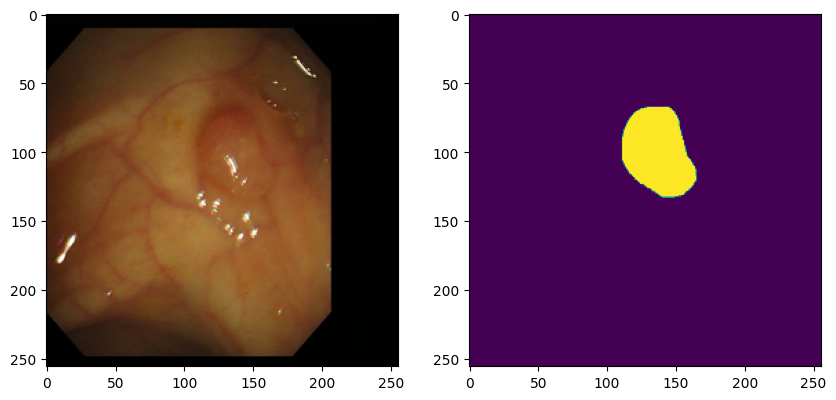

In [70]:
# data augmentation 효과가 잘 적용되었을지 학습 데이터 확인
for images, labels in train_dataset.take(1):
    # Running next element in our graph will produce a batch of images
    plt.figure(figsize=(10, 10))
    img = images[0]

    plt.subplot(1, 2, 1)
    plt.imshow(img)

    plt.subplot(1, 2, 2)
    plt.imshow(labels[0, :, :, 0])
    plt.show()

In [71]:
print('select the U-Net model')
model = unet_model
checkpoint_dir =os.path.join(DATASET_PATH,'train_ckpt/unet_model')

select the U-Net model


In [72]:
def dice_coeff(y_true, y_pred):
    smooth = 1e-10
    # Flatten the tensors
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    # Compute intersection and dice coefficient
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true_f)) + \
                                            tf.reduce_sum(tf.square(y_pred_f)) + smooth)
    return score

In [73]:
# dice loss가 최대화 되는 방향으로 구해지도록 설정
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [74]:
# binary crossentropy loss와 dice loss를 더하기
def bce_dice_loss(y_true, y_pred):
    loss = tf.reduce_mean(losses.binary_crossentropy(y_true, y_pred)) + dice_loss(y_true, y_pred)
    return loss

In [75]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [76]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

2024-08-30 16:14:51.354693: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.39GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-30 16:14:51.418138: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.39GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


(8, 256, 256, 1)


In [77]:
model.summary()

Model: "u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_block (EncoderBloc  multiple                  76416     
 k)                                                              
                                                                 
 encoder_block_1 (EncoderBl  multiple                  444288    
 ock)                                                            
                                                                 
 encoder_block_2 (EncoderBl  multiple                  1773312   
 ock)                                                            
                                                                 
 encoder_block_3 (EncoderBl  multiple                  7085568   
 ock)                                                            
                                                                 
 conv_block_4 (ConvBlock)    multiple                  283269

### callback 설정

- ModelCheckpoint callback 함수는 모델 학습간 특정 feature를 모니터링하다 기준점을 넘으면 모델 파라미터를 저장하는 역할을 합니다.
- LearningRateScheduler callback 함수는 학습을 진행하며, 주어진 인자의 값을 이용해 Learning rate를 조절해주는 함수입니다.
- cos_decay는 cos 함수의 모양으로 Learning rate를 조절해 주는 learning rate decay 구현입니다.

In [78]:
if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [79]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [80]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50


2024-08-30 16:15:02.811520: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.14GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-30 16:15:03.320633: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.27GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-30 16:15:03.347370: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 529.22MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-30 16:15:03.653264: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (G

30/30 [==============================] - 45s 967ms/step - loss: 1.0442 - dice_loss: 0.7030 - val_loss: 122163.4766 - val_dice_loss: 0.9181 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
30/30 [==============================] - 24s 816ms/step - loss: 0.9122 - dice_loss: 0.6876 - val_loss: 36.9963 - val_dice_loss: 0.9998 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
30/30 [==============================] - 24s 812ms/step - loss: 0.8570 - dice_loss: 0.6486 - val_loss: 9.4046 - val_dice_loss: 1.0000 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
30/30 [==============================] - 25s 837ms/step - loss: 0.7865 - dice_loss: 0.5914 - val_loss: 1.8793 - val_dice_loss: 0.9919 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0009842915460467339.
Epoch 5/50
30/30 [========================

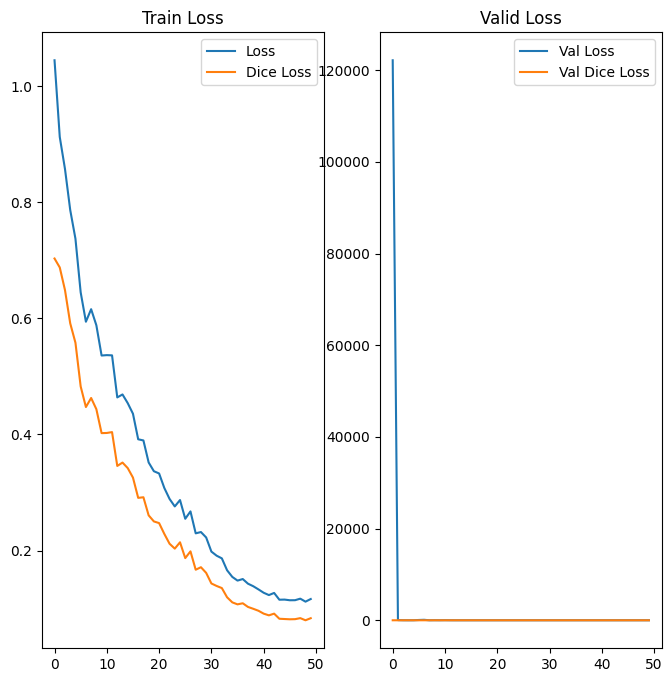

In [82]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

In [83]:
import tensorflow as tf
from tensorflow.keras.optimizers import legacy

# 레거시 Adam 옵티마이저 사용
optimizer = legacy.Adam()

# 모델 컴파일
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=['dice_loss'])

# 체크포인트 파일 경로
checkpoint_dir = os.path.join(DATASET_PATH, 'unet_ckpt/unet_model')

# 체크포인트에서 가중치 로드
model.load_weights(checkpoint_dir)

### 모델 평가

불러온 가중치를 이용해서 모델을 평가해 봅시다.  
meanIoU를 metric으로 하여 정량적으로 평가해 볼 수 있고, 실제 생성된 segmentation 이미지를 분석해서 정성적으로 평가해 볼 수 있습니다.

meanIoU란 각 이미지의 IoU 값을 평균 낸 값입니다. IoU는 segmentation 모델을 정량적으로 평가하는데 좋은 metric임
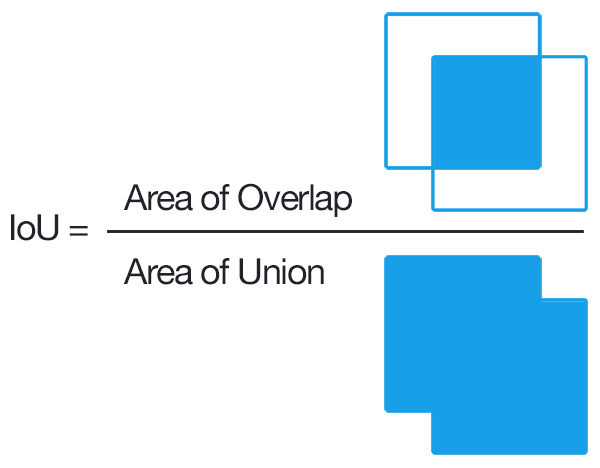

In [84]:
def mean_iou(y_true, y_pred, num_classes=2):
    # Flatten  
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])

    y_true_f = tf.cast(tf.round(y_true_f), dtype=tf.int32).numpy()
    y_pred_f = tf.cast(tf.round(y_pred_f), dtype=tf.int32).numpy()

    # calculate confusion matrix
    labels = list(range(num_classes))
    current = confusion_matrix(y_true_f, y_pred_f, labels=labels)

    # compute mean iou
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection

    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

In [85]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.9427731708771921


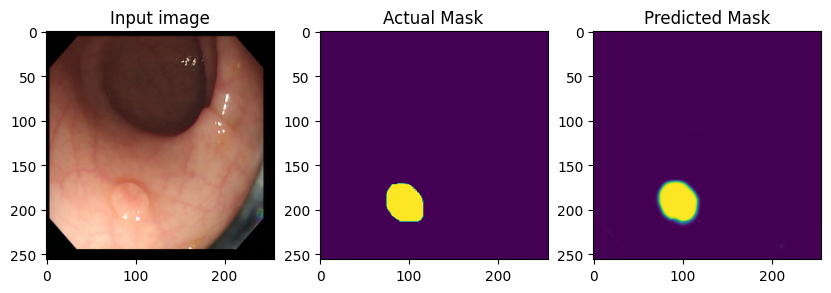

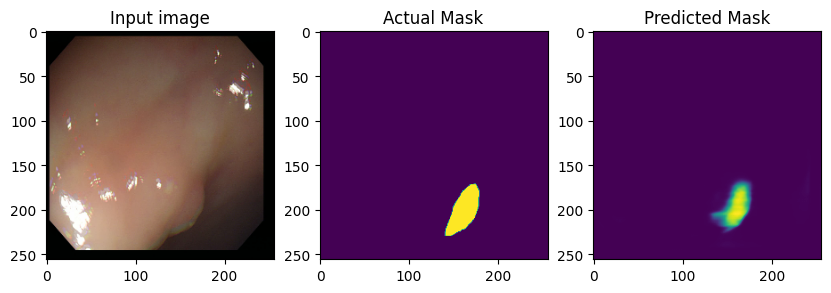

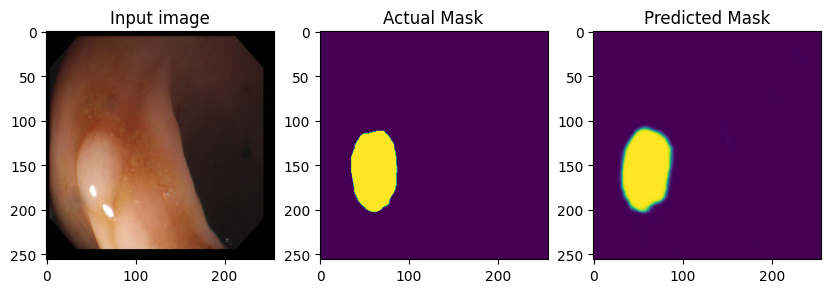

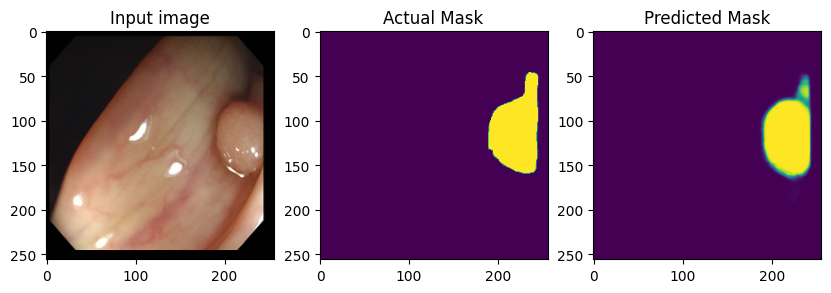

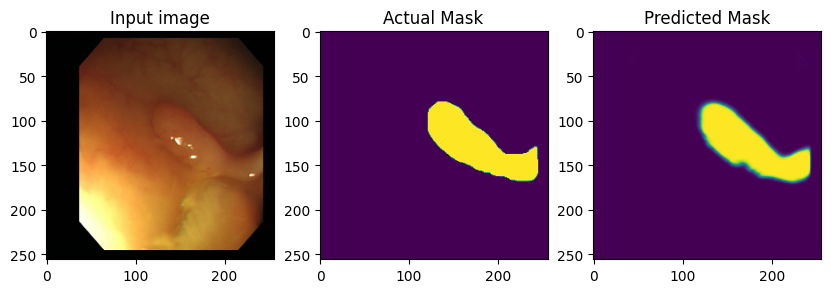

...

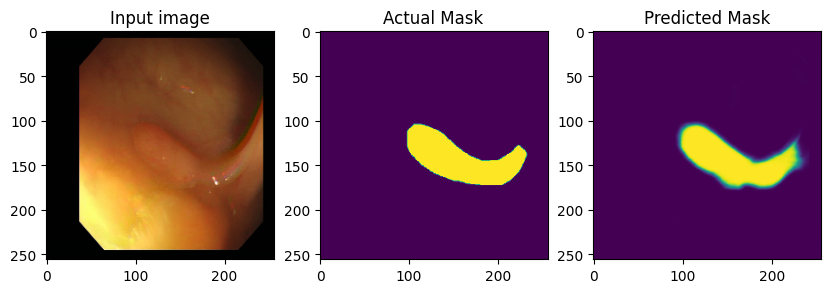

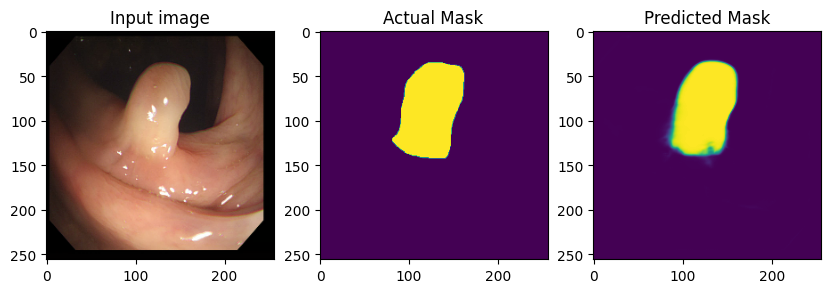

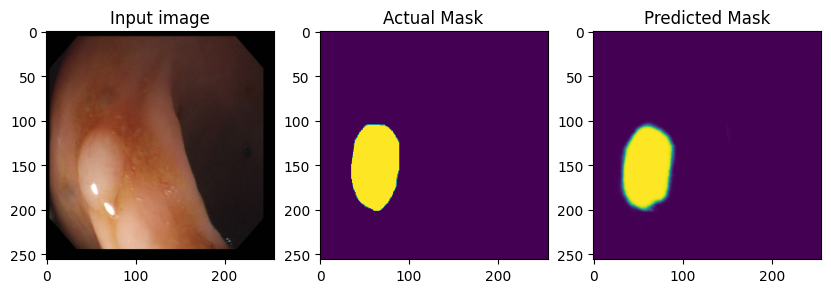

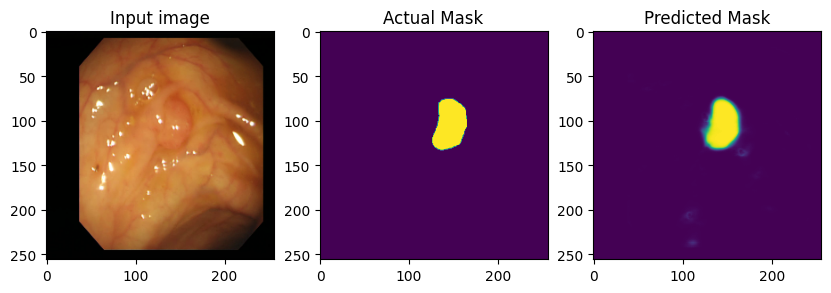

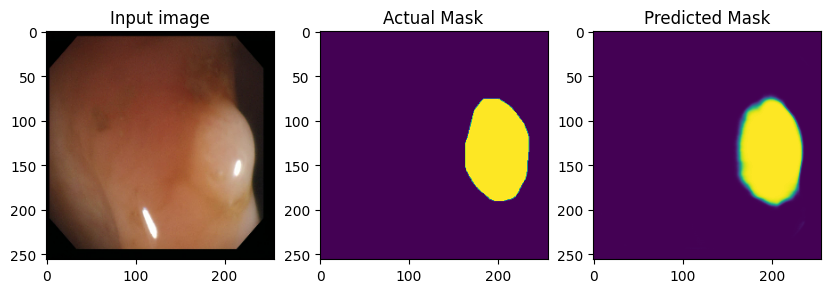

In [86]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

print_images()

## U-net 성능 개선해보기 : VGG16UNet

지금까지 우리는 Encoder-Decoder 모델과 U-Net 모델의 성능 차이를 실험을 통해 살펴보았습니다. 아마도 여러분들은 의료영상 Segmentation 모델을 위해 U-Net을 고려할 가치가 충분하다는 것을 확인할 수 있었을 것입니다.

그러나 이를 개선할 수 있는 방법 또한 무궁무진합니다. U-Net 또한 개선을 거듭해 왔고, 또 U-Net 기반이 아닌 다른 모델들도 많이 나오고 있습니다.

혹시, U-Net의 인코더 모델을 VGG, ResNet 등 기존의 pretrained model을 활용하는 것은 가능할까요? 또 그런 시도를 했을 때 성능 개선 효과가 있을까요?
Pretrained model들은 ImageNet 데이터를 이용해 pretrain된 것이 대부분입니다. 일반적으로는 transfer learning이 훨씬 효과적인 것으로 알려져 있지만, 의료 영상 도메인에도 동일하게 효과적일까요? 오늘의 프로젝트는 그것을 확인해 보는 것으로 하겠습니다.

In [87]:
# 주요 라이브버리 버전 확인  
import tensorflow
import sklearn
import numpy

print(tensorflow.__version__)
print(sklearn.__version__)
print(numpy.__version__)

2.13.1
1.3.2
1.24.3


리소스 부족 에러나면 batch 4로 수정해서 dataset 재구성하기

In [88]:
# # Set hyperparameters

# image_size = 256
# img_shape = (image_size, image_size, 3)
# batch_size = 4
# max_epochs = 50

In [89]:
# train_dataset = get_baseline_dataset(x_train_filenames, # 학습 데이터
#                                      y_train_filenames) # 정답 데이터
# train_dataset = train_dataset.repeat()
# test_dataset = get_baseline_dataset(x_test_filenames,
#                                     y_test_filenames,
#                                     is_train=False)
# train_dataset

In [90]:
# vgg16 레이어 구성 확인
vgg16 = tf.keras.applications.VGG16(input_shape=img_shape,
                                         include_top=False,
                                         weights='imagenet')
layer_outputs = [layer.output for layer in vgg16.layers]
layer_outputs

58889256/58889256 [==============================] - 4s 0us/step


[<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'input_1')>,
 <KerasTensor: shape=(None, 256, 256, 64) dtype=float32 (created by layer 'block1_conv1')>,
 <KerasTensor: shape=(None, 256, 256, 64) dtype=float32 (created by layer 'block1_conv2')>,
 <KerasTensor: shape=(None, 128, 128, 64) dtype=float32 (created by layer 'block1_pool')>,
 <KerasTensor: shape=(None, 128, 128, 128) dtype=float32 (created by layer 'block2_conv1')>,
 <KerasTensor: shape=(None, 128, 128, 128) dtype=float32 (created by layer 'block2_conv2')>,
 <KerasTensor: shape=(None, 64, 64, 128) dtype=float32 (created by layer 'block2_pool')>,
 <KerasTensor: shape=(None, 64, 64, 256) dtype=float32 (created by layer 'block3_conv1')>,
 <KerasTensor: shape=(None, 64, 64, 256) dtype=float32 (created by layer 'block3_conv2')>,
 <KerasTensor: shape=(None, 64, 64, 256) dtype=float32 (created by layer 'block3_conv3')>,
 <KerasTensor: shape=(None, 32, 32, 256) dtype=float32 (created by layer 'block3_pool')>,


아래는 VGG16을 Encoder로 활용하여 개선한 새로운 모델 클래스입니다. 이 모델을 구성하기 위해서 내부에서 새로운 모델(vgg16_act)을 만들었는데, 이것은 VGG16의 특정 레이어 출력을 가져와 Decoder와 연결하기 위한 것입니다. 기존 UNet 클래스와 비교하면, encoder 레이어가 없어지고 vgg16_act 모델의 출력이 그 역할을 대신하고 있음을 알수 있습니다.

In [91]:
class Vgg16UNet(tf.keras.Model):
    def __init__(self):
        super(Vgg16UNet, self).__init__()
        self.vgg16 = tf.keras.applications.VGG16(input_shape=img_shape,
                                         include_top=False,
                                         weights='imagenet')
        layer_outputs = [layer.output for layer in self.vgg16.layers]
        self.vgg16_act = models.Model(inputs=self.vgg16.input, 
                                      outputs=[layer_outputs[2], 
                                               layer_outputs[5], 
                                               layer_outputs[9], 
                                               layer_outputs[13], 
                                               layer_outputs[17]])


        self.center = ConvBlock(1024)

        self.decoder_block4 = DecoderBlock(512)
        self.decoder_block3 = DecoderBlock(256)
        self.decoder_block2 = DecoderBlock(128)
        self.decoder_block1 = DecoderBlock(64)

        self.output_conv = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, inputs, training=True):

        encoder1, encoder2, encoder3, encoder4, center = self.vgg16_act(inputs) 

        decoder4 = self.decoder_block4(center, encoder4)
        decoder3 = self.decoder_block3(decoder4, encoder3)
        decoder2 = self.decoder_block2(decoder3, encoder2)
        decoder1 = self.decoder_block1(decoder2, encoder1)
        
        outputs = self.output_conv(decoder1)

        return outputs

In [92]:
# UNet 모델 구현
model = Vgg16UNet()
checkpoint_dir =os.path.join(DATASET_PATH,'unet_ckpt/vgg_model')

In [93]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [94]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

(8, 256, 256, 1)


In [95]:
model.summary()

Model: "vgg16u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 model (Functional)          [(None, 256, 256, 64),    14714688  
                              (None, 128, 128, 128),             
                              (None, 64, 64, 256),               
                              (None, 32, 32, 512),               
                              (None, 16, 16, 512)]               
                                                                 
 conv_block_5 (ConvBlock)    multiple                  0 (unused)
                                                                 
 decoder_block_4 (DecoderBl  multiple                  9444864   
 ock)                                                            
                                                        

### callback 설정

- ModelCheckpoint callback 함수는 모델 학습간 특정 feature를 모니터링하다 기준점을 넘으면 모델 파라미터를 저장하는 역할을 합니다.
- LearningRateScheduler callback 함수는 학습을 진행하며, 주어진 인자의 값을 이용해 Learning rate를 조절해주는 함수입니다.
- cos_decay는 cos 함수의 모양으로 Learning rate를 조절해 주는 learning rate decay 구현입니다.

In [96]:
if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [97]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [98]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50
30/30 [==============================] - 20s 310ms/step - loss: 1.0559 - dice_loss: 0.7121 - val_loss: 5.4025 - val_dice_loss: 0.9061 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
30/30 [==============================] - 12s 415ms/step - loss: 0.8244 - dice_loss: 0.6109 - val_loss: 1.2013 - val_dice_loss: 0.8107 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
30/30 [==============================] - 12s 414ms/step - loss: 0.7594 - dice_loss: 0.5681 - val_loss: 1.0334 - val_dice_loss: 0.8106 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
30/30 [==============================] - 8s 280ms/step - loss: 0.7253 - dice_loss: 0.5460 - val_loss: 1.6427 - val_dice_loss: 0.8347 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler settin

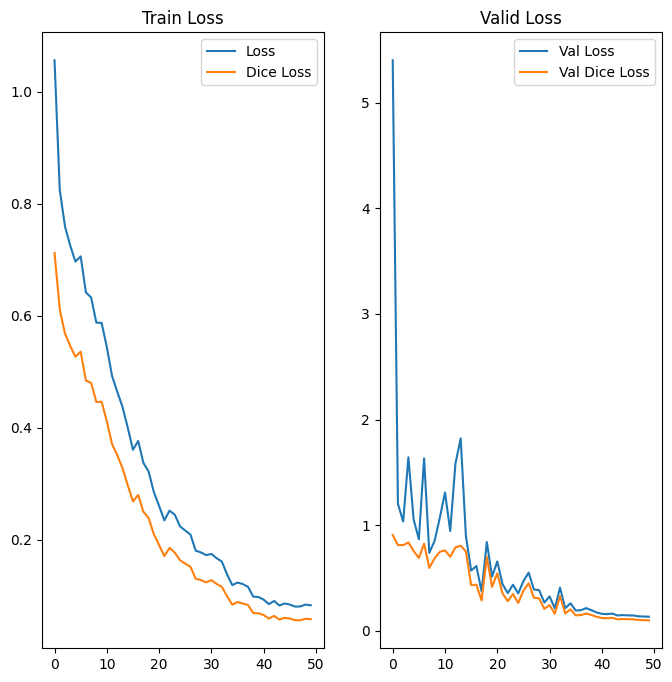

In [99]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

In [101]:
import tensorflow as tf
from tensorflow.keras.optimizers import legacy

# 레거시 Adam 옵티마이저 사용
optimizer = legacy.Adam()

# 모델 컴파일
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=['dice_loss'])

# 체크포인트 파일 경로
checkpoint_dir = os.path.join(DATASET_PATH, 'unet_ckpt/vgg_model')

# 체크포인트에서 가중치 로드
model.load_weights(checkpoint_dir)

### 모델 평가

불러온 가중치를 이용해서 모델을 평가해 봅시다.  
meanIoU를 metric으로 하여 정량적으로 평가해 볼 수 있고, 실제 생성된 segmentation 이미지를 분석해서 정성적으로 평가해 볼 수 있습니다.

meanIoU란 각 이미지의 IoU 값을 평균 낸 값입니다. IoU는 segmentation 모델을 정량적으로 평가하는데 좋은 metric임
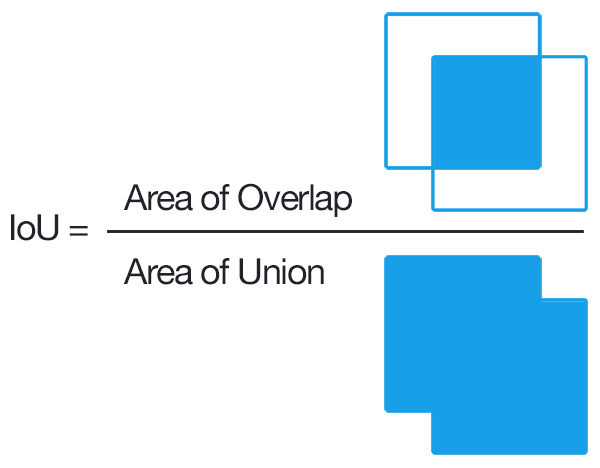

In [102]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.8849549314967331


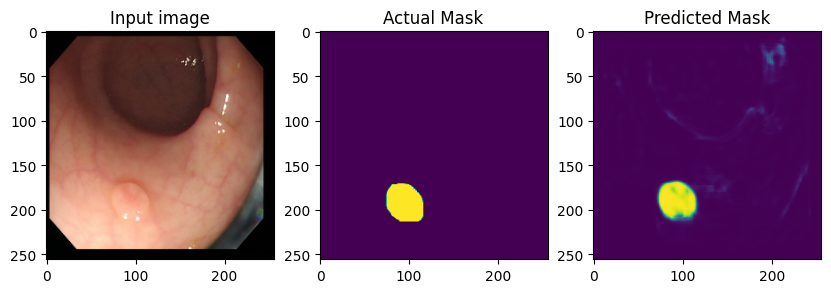

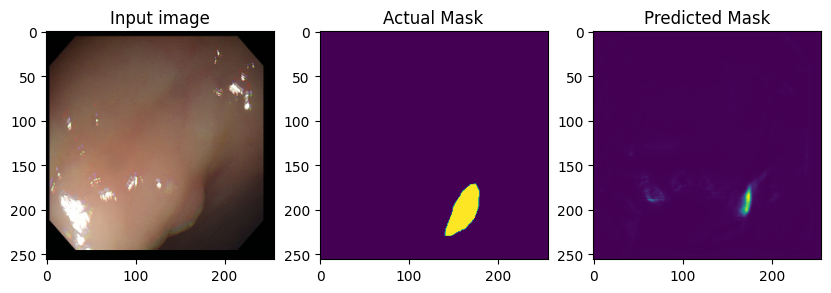

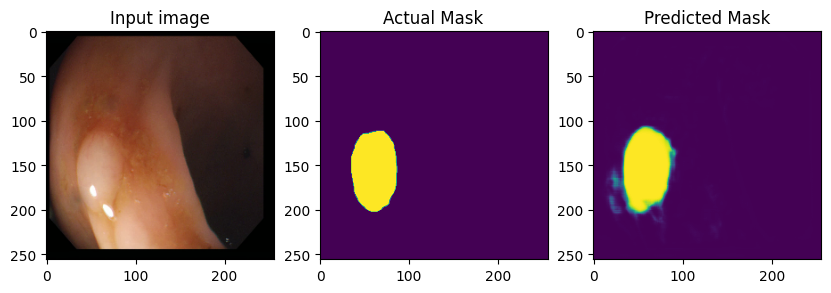

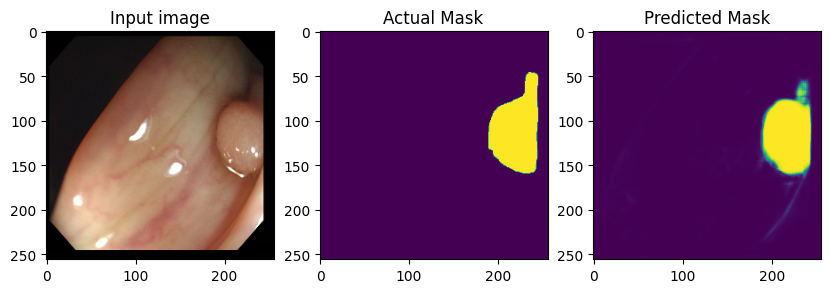

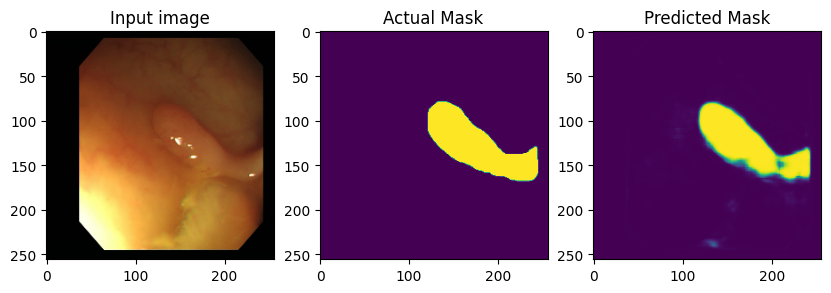

...

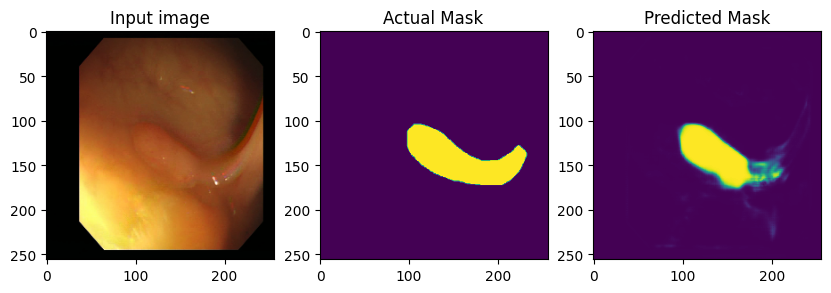

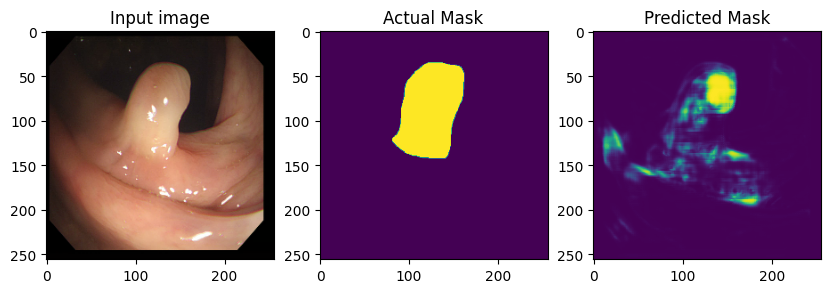

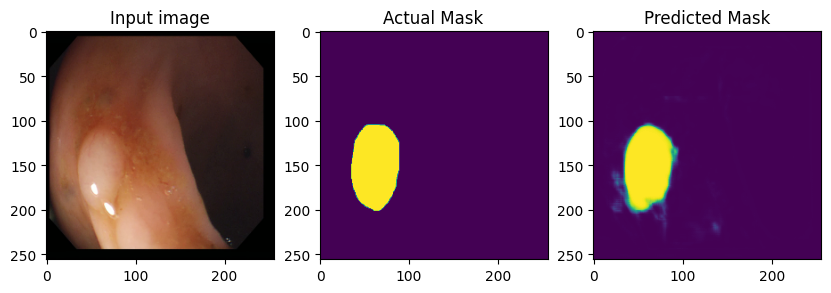

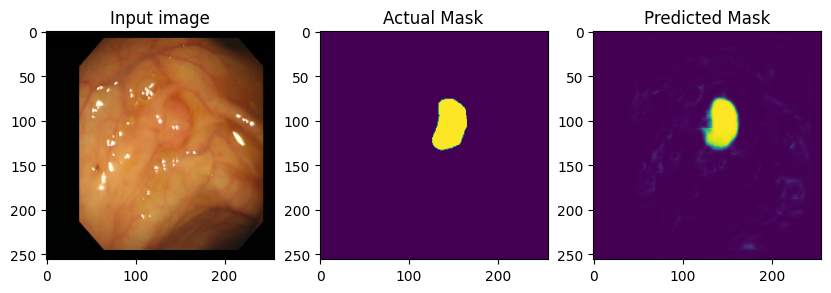

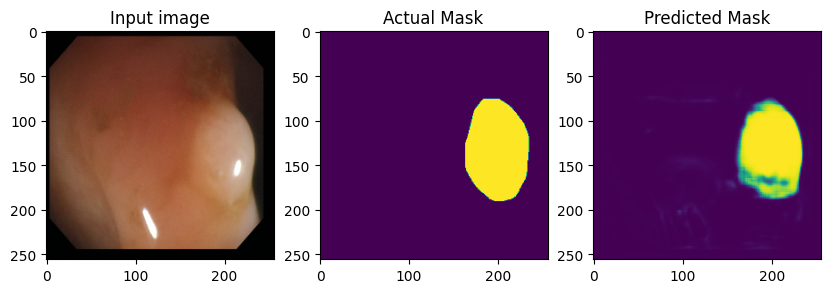

In [103]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

print_images()

## 전체 학습결과 비교

U-Net의 성능이 월등하게 좋다.   

**U-Net / Vgg16UNet / encoder-decoder 비교**

iou : 0.9427731708771921 / 0.8849549314967331 / 0.6650821296569355  
val_loss : 0.1952 / 0.1323 / 0.2425  
val_dice_loss: 0.1495 / 0.0983 / 0.1863  

  
실제 출력되는 결과 이미지만 봐도 encoder-decoder은 경계선도 흐릿하고 제대로 detect하지 못하는 비율도 높음   
val_loss는 VGG16UNet이 제일 낮았는데, IOU결과와 실제 결과이미지 출력 시 Unet이 가장 결과가 좋았음. 

UNet  
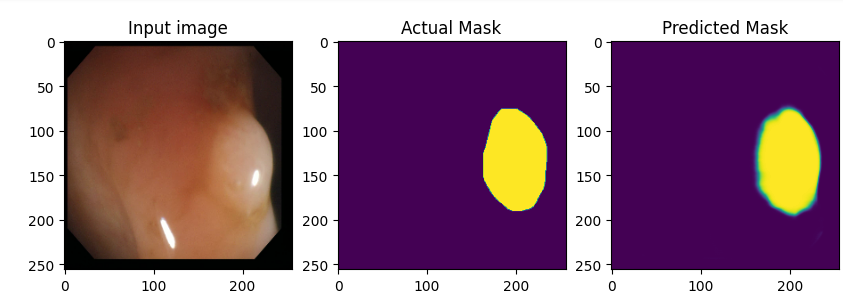

VGG16UNet  
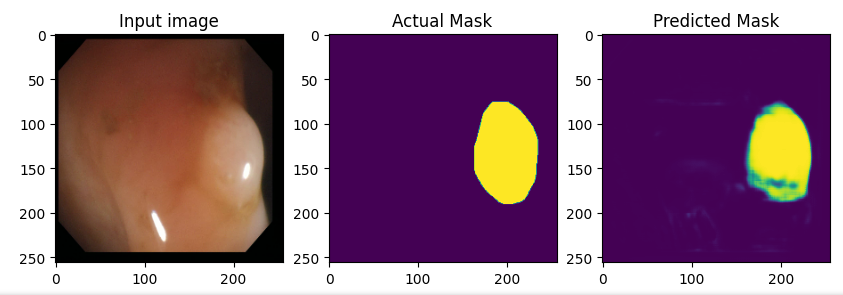

encoder-decoder  
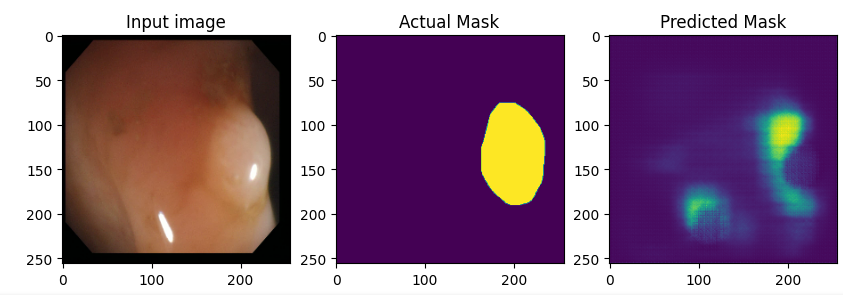